## Visualize and analyse results from synthetic data experiments

In [1]:
import math, time
import torch
import os
import sys
sys.path.append('../..')
from functions.get_data import data_n_loaders
import matplotlib.pyplot as plt

In [2]:
#get exptnames from folder names within saved_models
def get_exptnames():
    exptnames = []
    for root, dirs, files in os.walk('saved_models'):
        for dir in dirs:
            if 'checkpoints_' in dir:
                if 'topk' in dir:
                    if 'relu' in dir:
                        exptnames.append(dir.split('checkpoints_')[1])
                else:
                    exptnames.append(dir.split('checkpoints_')[1])
    #sort exptnames to have all with same sae_type (name after the first _ within exptnames) together; after saename, the float following must be used for sorting
    order = {'relu': 0, 'jumprelu': 1, 'spade': 3, 'topk': 2}
    exptnames = sorted(exptnames, key=lambda x: (order[x.split('_')[1]]))
    return exptnames

In [3]:
#get sae_types from expt_names: it will be the string after first _, except for spade, which should be repaced by sparsemax_dist
def get_sae_types(exptnames):
    sae_types = []
    for exptname in exptnames:
        if 'spade' in exptname:
            sae_types.append('sparsemax_dist')
        elif 'topk_relu' in exptname:
            sae_types.append('topk_relu')
        else:
            sae_types.append(exptname.split('_')[1])
    return sae_types

In [4]:
exptnames = get_exptnames()
#sort exptnames by using the number after k whenever topk is used
# exptnames = sorted(exptnames, key=lambda x: (int(x.split('_')[3].split('k')[1]) if 'topk_relu' in x else 0))

In [5]:
saetypes = get_sae_types(exptnames)

In [6]:
[(i,exptnames[i]) for i in range(len(exptnames)) if 'topk' in exptnames[i]]

[(14, 'oven615_topk_relu_k4_021425'),
 (15, 'lid221_topk_relu_k16_021425'),
 (16, 'kill672_topk_relu_k64_021425'),
 (17, 'will922_topk_relu_k32_021425'),
 (18, 'bulb185_topk_relu_k8_021425'),
 (19, 'shear233_topk_relu_k256_021425'),
 (20, 'grade476_topk_relu_k128_021425')]

In [8]:
from models import SAE
import numpy as np

index = 17
exptnameX = exptnames[index]
kvalX = 32
sae_type = saetypes[index]
dim = 128
epochnums = [0, 1] + [2**i for i in range(1, 13)] + [10938]

device = 'cuda'
modelsall = []
mseall = []
regall = []
mseperconceptall = []
width = 512 #standard in this expt set
for i in range(len(epochnums)):
    normalize_decoder = False if saetypes[i]=='sparsenax_dist' else True
    modeli = SAE(dim, width, sae_type='topk_relu',kval_topk=kvalX, normalize_decoder=normalize_decoder)
    state_dict = torch.load(f"./saved_models/checkpoints_{exptnameX}/model_{epochnums[i]}epochs.pt")
    modeli.load_state_dict(state_dict['model'])
    modelsall.append(modeli.to(device))

/tmp/ipykernel_3314574/3074117481.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f"./saved_models/checkpoints_{exptnameX}/model_{epochnums[i]}e

In [9]:
LAB_DIR = os.environ['USERDIR']
DATA_PATH = LAB_DIR+'/data'

In [10]:
meannorm2_concepts_all = []
dataset = f'128dgaussian_intrinsicdim'
batchsize = 512
_,_,train_data, _ = data_n_loaders(dataset, batchsize, return_data=True, \
                                    data_path=DATA_PATH, standardise_data = True)
#sample equal number of points from each class
numpoints_perconcept = 1000
num_concepts = 5
data_subset_perconcept = []
labels_subset_perconcept = []
for j in range(num_concepts):
    indices = train_data.labels == j
    rand_indices_i = torch.randperm(indices.sum())[:numpoints_perconcept]
    data_subset_perconcept.append(train_data.data[indices][rand_indices_i])
    labels_subset_perconcept.append(train_data.labels[indices][rand_indices_i])
    data_subset = torch.cat(data_subset_perconcept, dim=0)
    labels_subset = torch.cat(labels_subset_perconcept, dim=0)
for i in range(len(exptnames)):
    with torch.no_grad():
        meannorm2_concepts = torch.stack([torch.mean(torch.norm(data_subset[labels_subset==j,:], dim=1)**2) for j in range(num_concepts)])
        meannorm2_concepts_all.append(meannorm2_concepts)

/n/home00/sumedh/spmax_sae/experiments/expt16_intrindicdimX/../../functions/get_data.py:68: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  file = torch.load(datapath)


In [11]:
data_subset.shape

torch.Size([5000, 128])

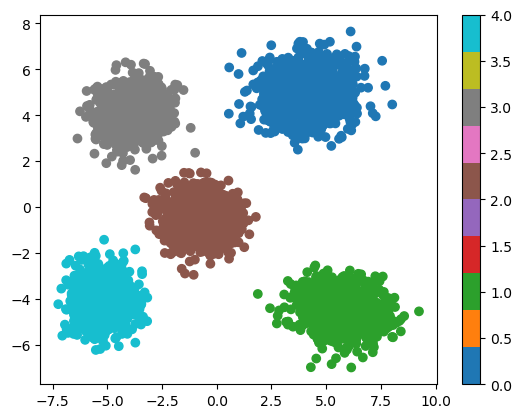

In [12]:
#pca of data_subset, plot with color code from labels_subset
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(data_subset)
data_subset_pca = pca.transform(data_subset)
plt.scatter(data_subset_pca[:,0], data_subset_pca[:,1], c=labels_subset, cmap='tab10')
plt.colorbar()
plt.show()

In [13]:
concept_intrinsicdims = train_data.truefeatures['intrinsic_dims']

In [14]:
latent_reps_all = []
preds_all = []
Cdatacos = []
stableranks = []
from functions.utils import stable_rank

for i in range(len(epochnums)):
    modeli = modelsall[i]
    with torch.no_grad():
        pred, latent_reps = modeli(data_subset.to(device), return_hidden=True)
        latent_reps_all.append(latent_reps.cpu())
        preds_all.append(pred.cpu())
        Cdata = latent_reps @ latent_reps.T
        
        norms = torch.norm(latent_reps, dim=1).unsqueeze(1)
        Cdatacos.append(Cdata/(norms @ norms.T + 1e-12))
        sr = stable_rank(Cdatacos[i])
        stableranks.append(sr.cpu().item())

Text(0, 0.5, 'stable rank')

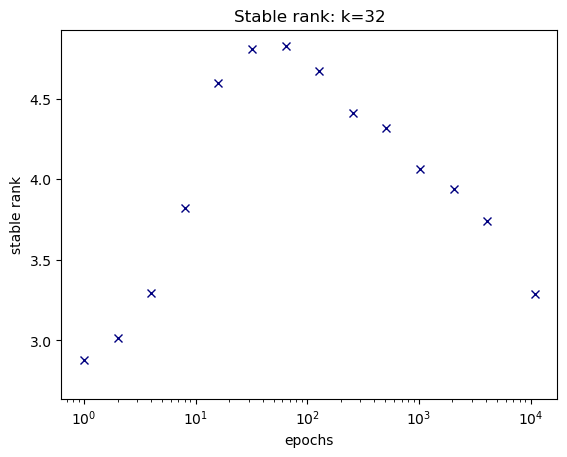

In [15]:
fig, ax = plt.subplots()



# ax2 = ax.twinx() 

colors_concepts = ['r','lightblue','g','m','brown']
# for k in range(num_concepts):
#     if k==0:
#         label='mse/|x|^2'
#     else:
#         label=''
#     ax2.scatter(epochnums, mseconcepts[:,k], \
#         label='nmse: d'+str(intrinsicdims[k].item()), color=colors_concepts[k])
ax.plot(epochnums, stableranks[:], 'x', label='topk', color='navy')
# ax.legend()
# ax2.set_yscale('log')
    

ax.set_title("Stable rank: k="+str(kvalX))
# ax2.legend(loc='lower left')
ax.set_xscale('log')
ax.set_xlabel('epochs')
ax.set_ylabel('stable rank')
# ax2.set_ylabel('mse per concept')

In [16]:
deadlatents_all = []
for i in range(len(epochnums)):
    threshold = torch.quantile(latent_reps_all[i][latent_reps_all[i]>0.0].flatten(), 0.1)
    # threshold = 1e-12
    deadlatents = torch.all(latent_reps_all[i] <= threshold, dim=0)
    deadlatents_all.append(deadlatents)

#identify concept which latent activates most for
classavg_reps = [torch.zeros(num_concepts, latent_reps_all[0].shape[-1]) for i in range(len(epochnums))]
for i in range(len(epochnums)):
    for c in range(num_concepts):
        classavg_reps[i][c] = torch.mean(latent_reps_all[i][labels_subset==c], dim=0)    
order_by_concept_all = []
concepts_of_latents_all = []
for i in range(len(epochnums)):
    concepts_of_latents = torch.argmax(classavg_reps[i][:, ~deadlatents_all[i]], dim=0) #gives indices of concepts with max value in each latent dimension
    order_by_concept = torch.argsort(concepts_of_latents) #sorts latents by concept
    order_by_concept_all.append(order_by_concept)
    concepts_of_latents_all.append(concepts_of_latents)


#sort latent representations by concept
latentreps_conceptsorted_all = []
for i in range(len(epochnums)):
    activelatents = ~deadlatents_all[i]
    latentsactive = latent_reps_all[i][:, activelatents]
    latentsactive_conceptsorted = latentsactive[:, order_by_concept_all[i]]
    latentsdead = latent_reps_all[i][:, ~activelatents]
    latents_sortedanddead = torch.cat([latentsactive_conceptsorted, latentsdead], dim=1)
    latentreps_conceptsorted_all.append(latents_sortedanddead) #reorder latents by concepts

In [17]:
#track co-occurrence of latents
Clatent = []
for i in range(len(epochnums)):
    Clatent.append(latentreps_conceptsorted_all[i].T @ latentreps_conceptsorted_all[i])

Clatent_cos = []
Clatent_cos_active = []
for i in range(len(epochnums)):
    norms = torch.norm(latentreps_conceptsorted_all[i], dim=0).unsqueeze(1)
    active_i = norms>0.0
    eps = 1e-6
    Clatent_cos.append(Clatent[i]/(eps+ (norms @ norms.T)))


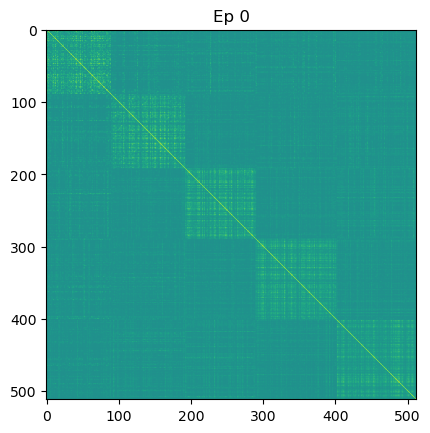

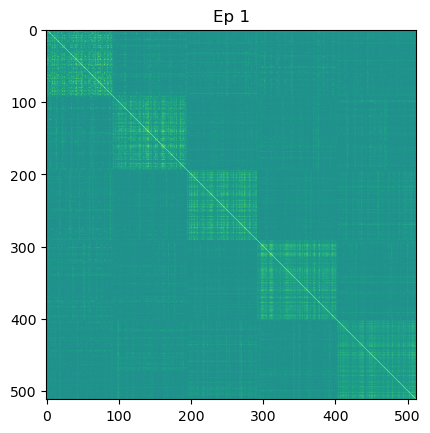

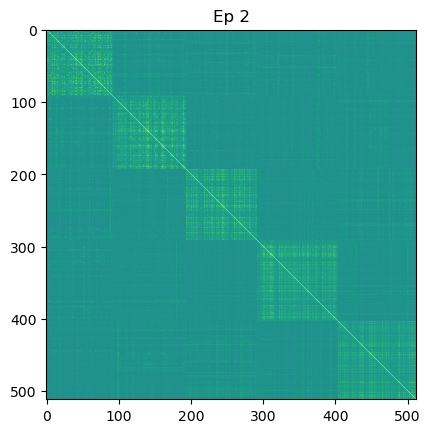

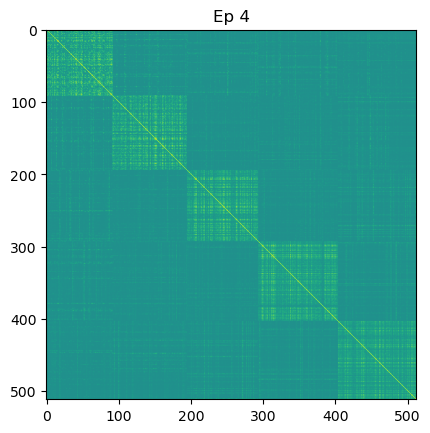

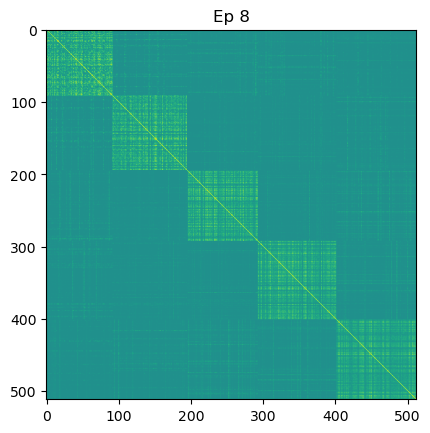

...

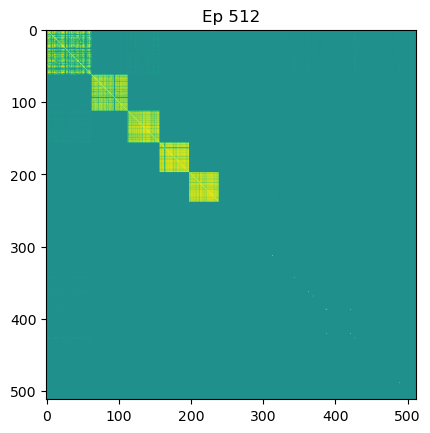

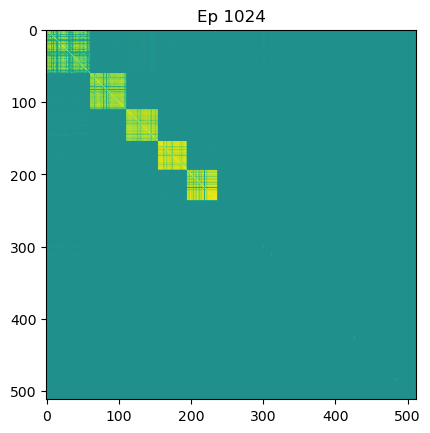

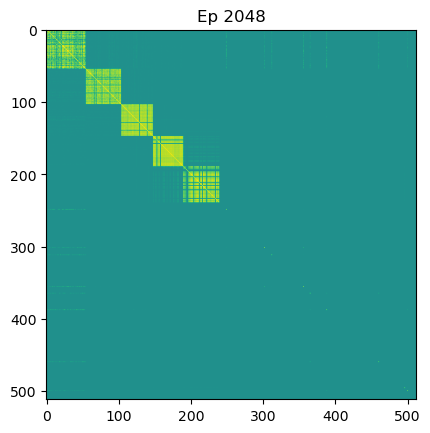

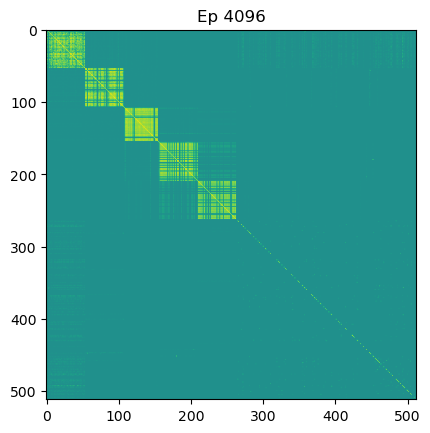

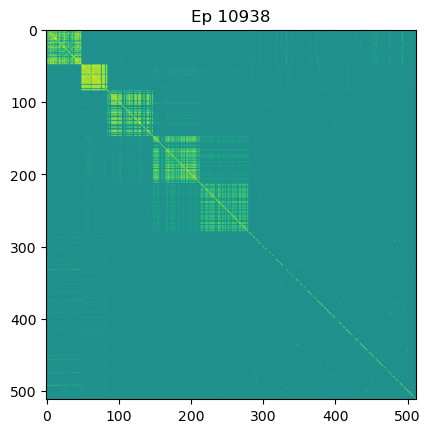

In [18]:
for i in range(len(epochnums)):
    C = Clatent_cos[i].cpu()
    # C = C[~deadlatents_all[i], :]
    # C = C[:, ~deadlatents_all[i]]
    temp = plt.imshow(C, cmap='viridis', vmin=-1, vmax=1)
    # plt.title(f'k={kvalX}')
    # ax[i].set_xticks([])
    # ax[i].set_yticks([])
    plt.title(f"Ep {epochnums[i]}")
    plt.show()

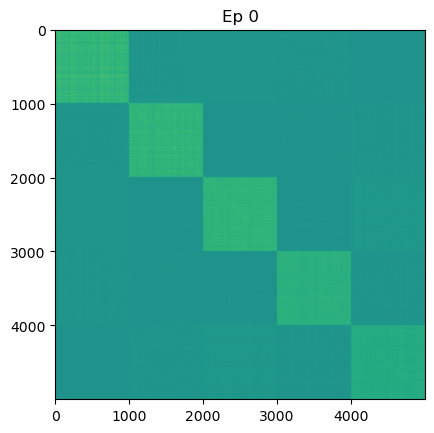

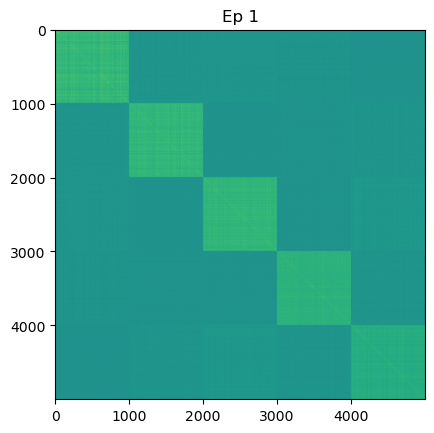

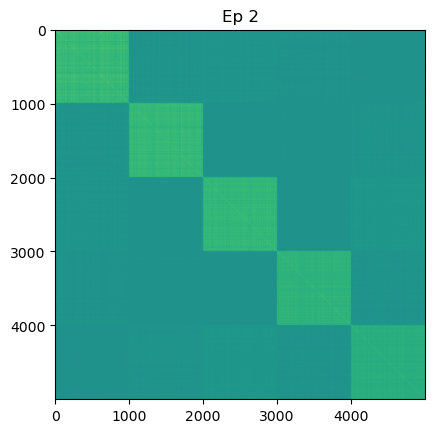

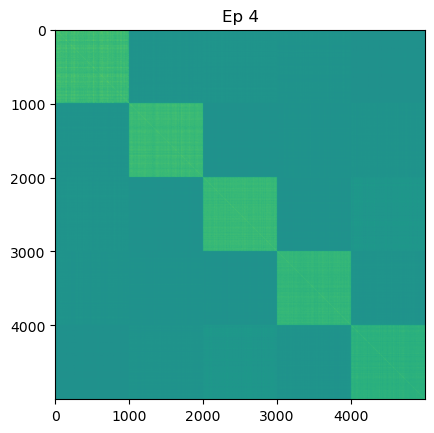

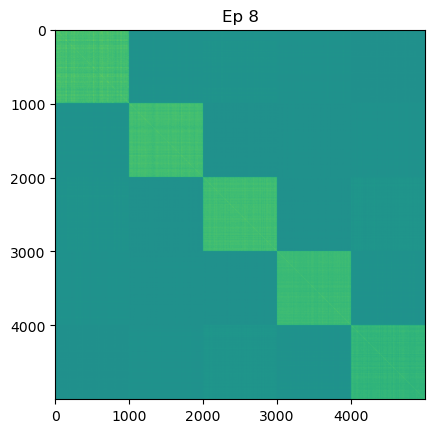

...

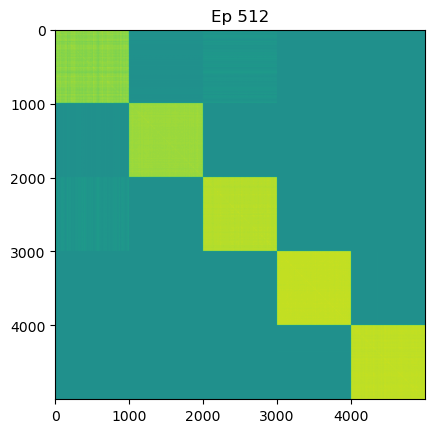

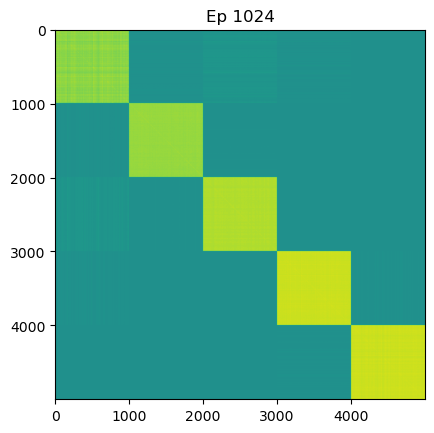

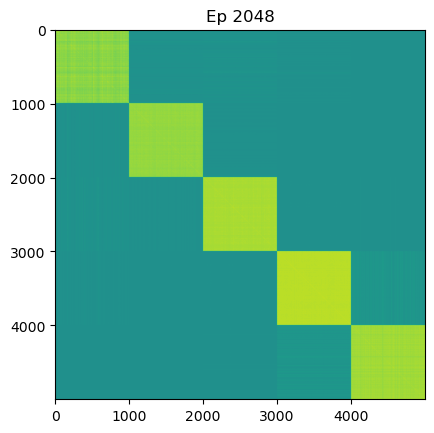

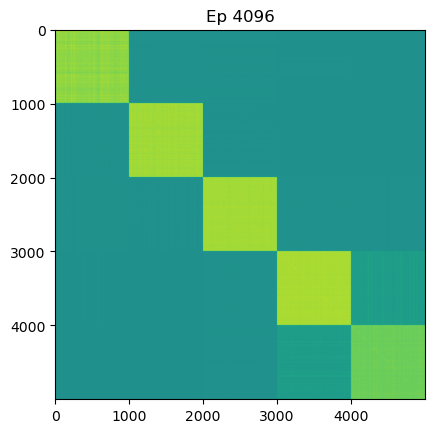

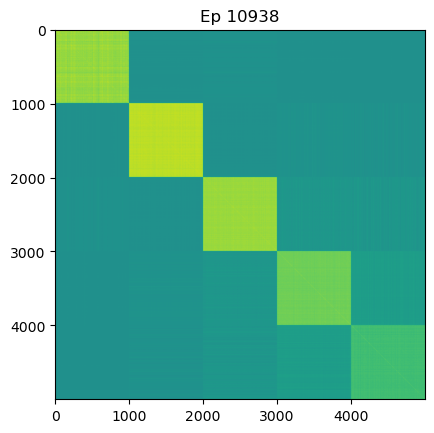

In [19]:
for i in range(len(epochnums)):
    C = Cdatacos[i].cpu()
    # C = C[~deadlatents_all[i], :]
    # C = C[:, ~deadlatents_all[i]]
    temp = plt.imshow(C, cmap='viridis', vmin=-1, vmax=1)
    # plt.title(f'k={kvalX}')
    # ax[i].set_xticks([])
    # ax[i].set_yticks([])
    plt.title(f"Ep {epochnums[i]}")
    plt.show()

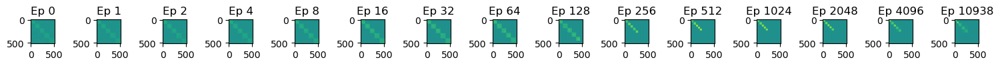

In [20]:

fig, ax = plt.subplots(1, len(epochnums), figsize=(len(epochnums),2), sharex=True)

for i in range(len(epochnums)):
    C = Clatent_cos[i].cpu()
    # C = C[~deadlatents_all[i], :]
    # C = C[:, ~deadlatents_all[i]]
    temp = ax[i].imshow(C, cmap='viridis', vmin=-1, vmax=1)
    ax[i].set_title(f'k={kvalX}')
    # ax[i].set_xticks([])
    # ax[i].set_yticks([])
    ax[i].set_title(f"Ep {epochnums[i]}")
fig.tight_layout()
# fig.colorbar(temp, ax=ax[-1], pad=0.1, fraction=0.05)
plt.show()

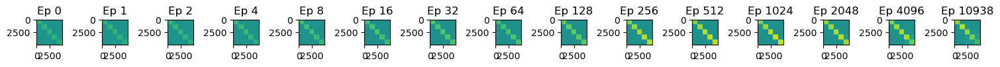

In [21]:

fig, ax = plt.subplots(1, len(epochnums), figsize=(len(epochnums),2), sharex=True)

for i in range(len(epochnums)):
    ax[i].imshow(Cdatacos[i].cpu(), cmap='viridis', vmin=-1, vmax=1)
    ax[i].set_title(f'k={kvalX}')
    # ax[i].set_xticks([])
    # ax[i].set_yticks([])
    ax[i].set_title(f"Ep {epochnums[i]}")
fig.tight_layout()

plt.show()

In [22]:
nonzero_wts = []
nonzero_latents = []
for i in range(len(epochnums)):
  
    nonzero_latents.append(deadlatents_all[i].argwhere().flatten())

    expt_index = i
    wtsenc = modelsall[expt_index].Ae.detach().cpu()
    wtsdec = modelsall[expt_index].Ad.T.detach().cpu()
    nonzerowts_ind = (torch.sum(torch.abs(wtsenc), dim=1)>1e-6).argwhere().flatten()
    nonzero_wts.append(nonzerowts_ind)

In [23]:
stableranks_wts = []
Cwts_all = []
for i in range(len(epochnums)):
    wts = modelsall[i].Ae.detach().cpu()
    active = nonzero_wts[i]
    wtsactive = wts[active, :]
    wtsactive_sort = wtsactive[order_by_concept_all[i], :]
    # wtssorted = torch.cat([wtsactive_sort, wts[~active, :]], dim=0)
    wtssorted = wtsactive_sort
    norms = torch.norm(wtssorted, dim=1).unsqueeze(1)
    Cwts = wtssorted @ wtssorted.T / (1e-12+ norms@norms.T)
    Cwts_all.append(Cwts)
    sr = stable_rank(Cwts)
    stableranks_wts.append(sr)

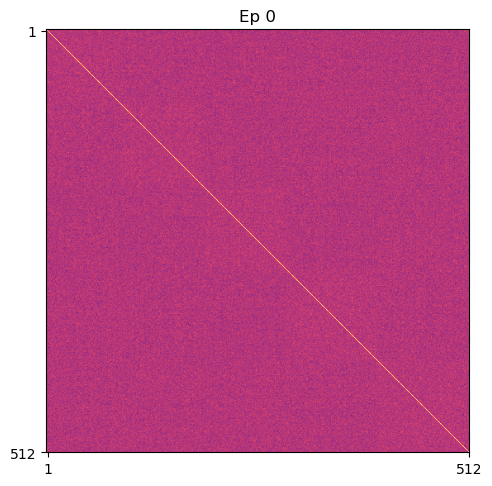

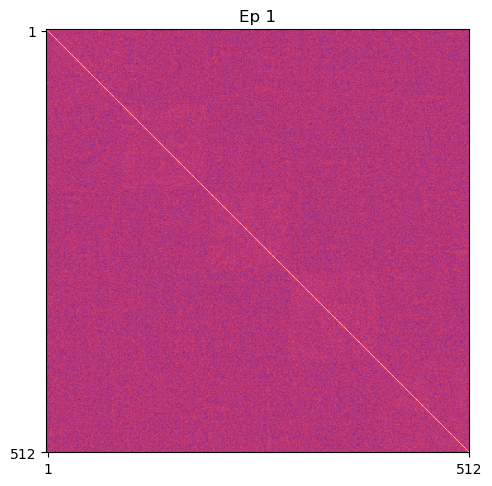

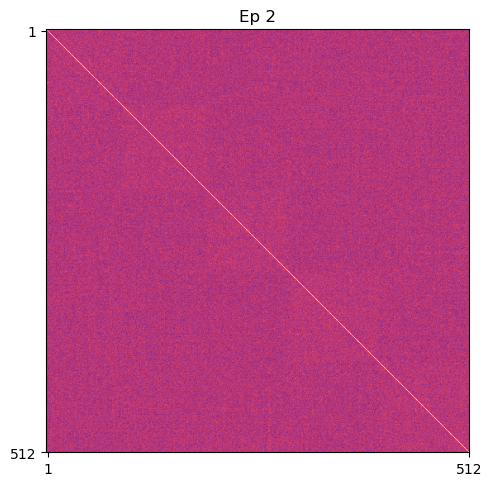

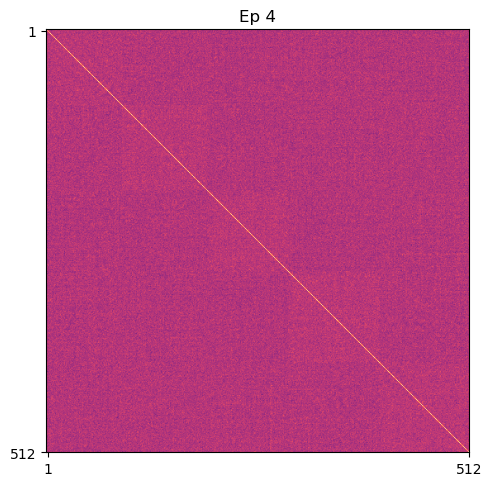

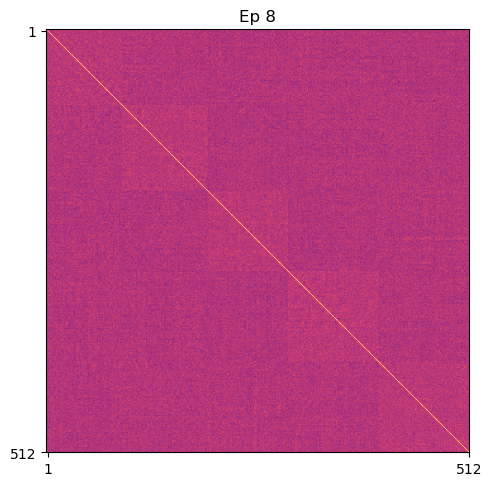

...

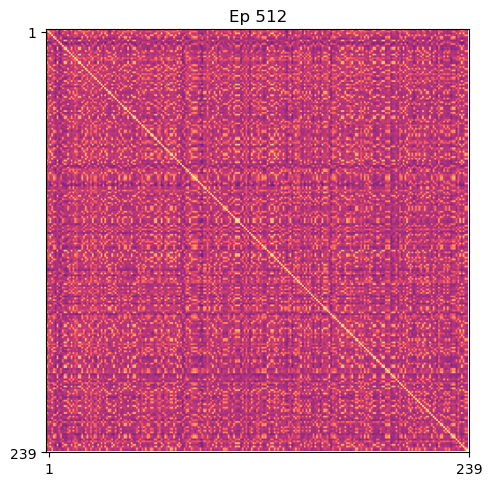

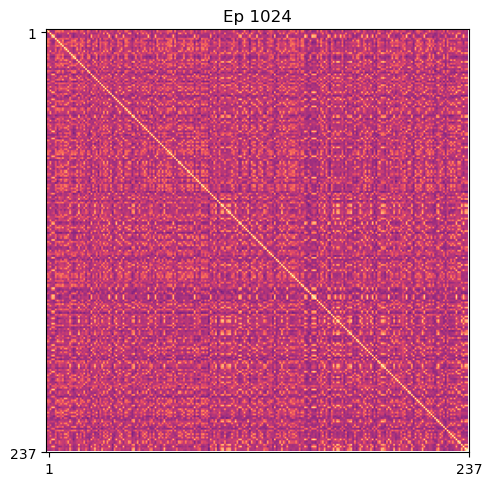

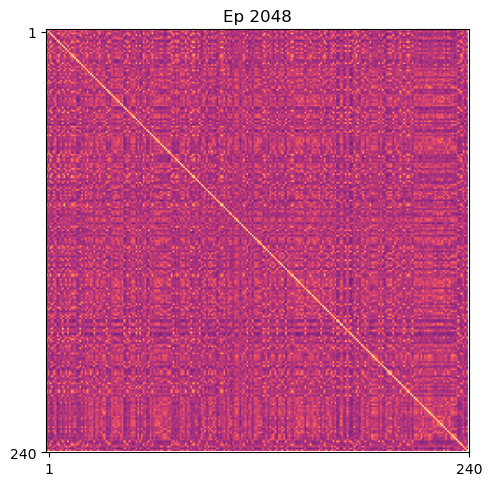

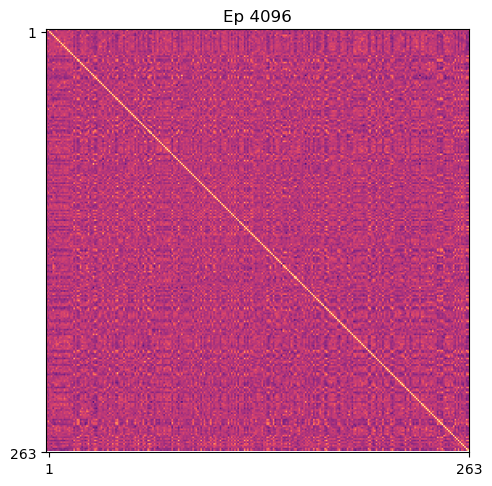

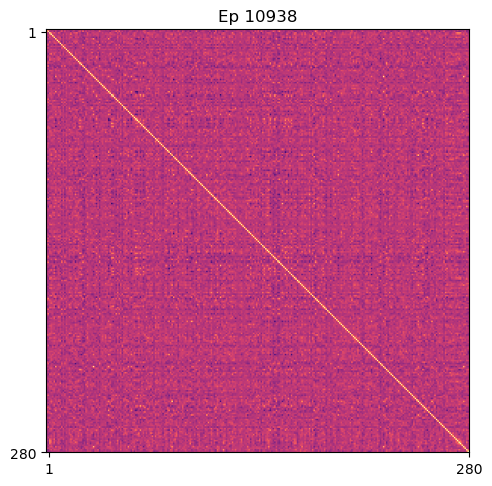

In [24]:


for i in range(len(epochnums)):
    fig, ax = plt.subplots(1, 1, figsize=(5,5))
    ax.imshow(Cwts_all[i].cpu(), cmap='magma', vmin=-1, vmax=1)
    ax.set_title(f'Ep {epochnums[i]}')
    ax.set_yticks([1, Cwts_all[i].shape[0]])
    ax.set_xticks([1, Cwts_all[i].shape[0]])

    # fig.colorbar(ax.imshow(Cwts_all[0].cpu(), cmap='rainbow', vmin=-1, vmax=1), ax=ax, location='right', pad=0.3, fraction=0.01)
    # fig.suptitle("Cosine similarity between nonzero weight vectors")

    fig.tight_layout()
    plt.show()

In [40]:
mse_data = torch.zeros((len(epochnums), num_concepts))
mse_center = torch.zeros((len(epochnums), num_concepts))
mse_meanpred = torch.zeros((len(epochnums), num_concepts))
datavars = torch.zeros((num_concepts,))
centernorm2 = torch.zeros((num_concepts,))
for k in range(num_concepts):
    datavars[k] = torch.var(data_subset[labels_subset==k,:], dim=0).sum()
    centernorm2[k] = torch.norm(data_subset[labels_subset==k,:].mean(dim=0))**2
for i in range(len(epochnums)):
    for k in range(num_concepts):
        center_k = data_subset[labels_subset==k,:].mean(dim=0, keepdim=True)
        mse_k = (preds_all[i][labels_subset==k,:]-center_k).pow(2).sum(dim=-1).mean()
        mse_center[i,k] = mse_k
        mse_data[i,k] = (preds_all[i][labels_subset==k,:]-data_subset[labels_subset==k,:]).pow(2).sum(dim=-1).mean()
        mse_meanpred[i,k] = (preds_all[i][labels_subset==k,:].mean(dim=0, keepdim=True)-data_subset[labels_subset==k,:]).pow(2).sum(dim=-1).mean()

In [41]:
norm2wts = torch.zeros((len(epochnums), num_concepts))
for i in range(len(epochnums)):
    wts = modelsall[i].Ae.detach().cpu()
    wtsactive = wts[~deadlatents_all[i],:]
    #indics of latents 
    for k in range(num_concepts):
        norm2wts[i,k] = torch.norm(wtsactive[concepts_of_latents_all[i]==k], dim=1).square().mean()

In [43]:
datavars

tensor([67.7320, 65.2965, 66.0054, 65.4578, 66.3450])

Text(0.5, 0.98, 'MSE')

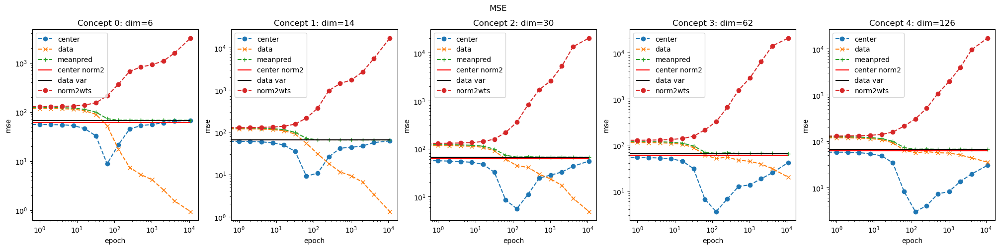

In [44]:
fig, ax = plt.subplots(1, num_concepts, figsize=(5*num_concepts,5), sharex=True)

for i in range(num_concepts):
    ax[i].plot(epochnums, mse_center[:,i], 'o--', label=f'center')
    ax[i].plot(epochnums, mse_data[:,i], 'x--', label='data')
    ax[i].plot(epochnums, mse_meanpred[:,i], '+--', label='meanpred')
    ax[i].hlines(centernorm2[i], epochnums[0], epochnums[-1], label='center norm2', color='r')
    ax[i].hlines(datavars[i], epochnums[0], epochnums[-1], label='data var', color='k')
    ax[i].plot(epochnums, norm2wts[:,i], 'o--', label='norm2wts')
    ax[i].set_title(f'Concept {i}: dim={concept_intrinsicdims[i]}')
    ax[i].set_xscale('log')
    ax[i].set_yscale('log')
    # ax[i].set_xticks(epochnums)
    ax[i].set_xlabel("epoch")
    ax[i].set_ylabel("mse")
    ax[i].legend()
fig.suptitle("MSE")
# plt.xticks(epochnums)


In [28]:
numactive = torch.zeros(len(epochnums), len(labels_subset))
thr = 0.2
for i in range(len(epochnums)):
    threshold = torch.quantile(latent_reps_all[i][latent_reps_all[i]>1e-6].flatten(),thr)
    numactive[i] = (latent_reps_all[i]>threshold).sum(dim=1)
numactive_concepts = []
for i in range(len(epochnums)):
    numactive_concepts.append(torch.stack([numactive[i][labels_subset==j].mean() for j in range(num_concepts)]))
numactive_concepts = torch.stack(numactive_concepts, dim=0)

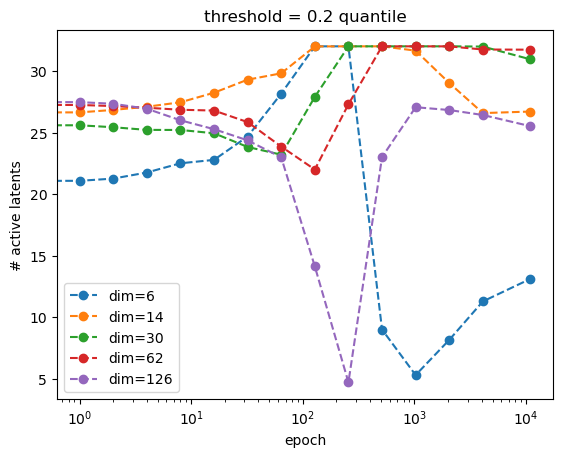

In [29]:
for i in range(num_concepts):
    plt.plot(epochnums, numactive_concepts[:,i], 'o--', label=f'dim={concept_intrinsicdims[i]}')
plt.legend()
plt.xlabel("epoch")
plt.title(f"threshold = {thr} quantile")
plt.ylabel("# active latents")
plt.xscale('log')

Text(0.5, 1.0, 'number of active latents')

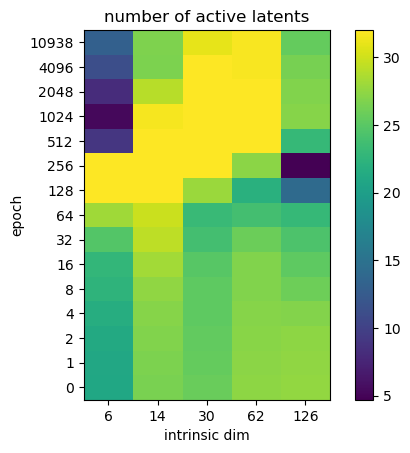

In [30]:
plt.imshow(numactive_concepts, cmap='viridis', aspect=0.5,interpolation='nearest', origin='lower')
plt.xticks(range(len(concept_intrinsicdims)), concept_intrinsicdims.tolist())
plt.yticks(range(len(epochnums)), torch.tensor(epochnums).tolist())
plt.xlabel("intrinsic dim")
plt.ylabel("epoch")
plt.colorbar()
plt.title("number of active latents")

In [31]:
var_concepts = []
mean_concepts = torch.zeros((num_concepts, dim))
for k in range(num_concepts):
    var_concepts.append(torch.var(data_subset[labels_subset==k,:], dim=0).sum())
    mean_concepts[k,:] = torch.mean(data_subset[labels_subset==k,:], dim=0)

In [32]:
var_concepts

[tensor(67.7320),
 tensor(65.2965),
 tensor(66.0054),
 tensor(65.4578),
 tensor(66.3450)]